In [1]:
############### MACHINE LEARNING #######################################
#Import Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
import pyodbc 
import tensorboard
import datetime
from tensorflow import keras
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot
from numpy import where
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from mpl_toolkits.mplot3d import Axes3D
from pandas.plotting import scatter_matrix
from sklearn import tree
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode,  plot
from plotly.graph_objs import *
from sklearn import preprocessing
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import TomekLinks
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from datetime import datetime
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [2]:
#read the historical data from Github repository
url = 'https://raw.githubusercontent.com/stefand-ml/Machine-Learning-Project/main/FlightRadar24.csv'
dataset = pd.read_csv(url)
print(dataset) #raw input dataset

       Unnamed: 0 FlightNo   ActualTimeDep     Status AC Model    Lat Arr  \
0               0    LY316  Departed 14:48   departed     B789  32.011379   
1               1    BA227  Departed 14:41   departed     B789  33.636719   
2               2    EI165  Departed 14:40   departed     A320  53.421379   
3               3   BA1448  Departed 14:47   departed     A320  55.950001   
4               4    BA818  Departed 14:26   departed     A320  55.616959   
...           ...      ...             ...        ...      ...        ...   
86499          47    NH212       Scheduled  scheduled      77W  35.552250   
86500          48     BA27       Scheduled  scheduled      77F  22.309616   
86501          49    SQ319       Scheduled  scheduled      359   1.350189   
86502          50    OZ522       Scheduled  scheduled      359  37.469070   
86503          51    ET701       Scheduled  scheduled      359   8.977889   

          Lon Arr Dest Country ScheduledTimeArr ActualTimeArr ActualTimeDep

In [3]:
#first step is to drop duplicate values
pd.DataFrame.drop_duplicates(dataset,inplace=True) #drop duplicate values
dataset = dataset.drop(dataset.columns[0], axis=1) #drop first column (index column)

In [4]:
#Data Cleansing#
#Firstly, we have to get rid of past scheduled data and keep only past actual data (flights that happened)
dataset1 = dataset[dataset["Status"] == "departed"] #That means that we will keep all values which have status "departed"
dataset1 = dataset1.drop(["Status"], axis= "columns") #Drop this column now, it is not needed

In [5]:
#In order to construct our depended variable column, we have to set a threshold. If the difference between actual and 
#scheduled time is more than 20 minutes on departure (we set delay), the dependend variable will be 1, else 0

dataset1["difference"]=pd.to_timedelta(dataset1["ActualTimeDep.1"])-pd.to_timedelta(dataset1["ScheduledTimeDep"]) #Find time difference between actual and scheduled
dataset1['duration'] = dataset1['difference'].astype(str).str[7:] #Keep only time as string
dataset1[['Hours' , 'Minutes' , 'Seconds']] = dataset1['duration'].str.split(':',expand=True)#Split hours, minutes, seconds
dataset1['Hours'] = dataset1['Hours'].astype(str).str.replace("+", "-")
dataset1['Hours'] = dataset1['Hours'].astype(int)
dataset1['Minutes'] = dataset1['Minutes'].astype(int)
dataset1['Seconds'] = dataset1['Seconds'].astype(int)
dataset1 = dataset1.reset_index()
dataset1 = dataset1.drop(dataset1.columns[0], axis=1)
dataset1["Delay"]=0

In [6]:
#Set the dependent variable
for i in dataset1.index:
    if dataset1['Hours'][i] >0 :
        dataset1["Delay"][i]=1
for i in dataset1.index:
    if dataset1['Minutes'][i] > 20 and dataset1['Hours'][i] >=0:
        dataset1["Delay"][i] = 1
dataset1

,FlightNo,ActualTimeDep,AC Model,Lat Arr,Lon Arr,Dest Country,ScheduledTimeArr,ActualTimeArr,ActualTimeDep.1,Date,ScheduledTimeDep,difference,duration,Hours,Minutes,Seconds,Delay
0,LY316,Departed 14:48,B789,32.011379,34.886662,IL,19:05:00,18:54:57,14:48:40,10-12-20,14:20:00,0 days 00:28:40,00:28:40,0,28,40,1
1,BA227,Departed 14:41,B789,33.636719,-84.428001,US,0:05:00,23:16:44,14:41:48,10-12-20,14:20:00,0 days 00:21:48,00:21:48,0,21,48,1
2,EI165,Departed 14:40,A320,53.421379,-6.270000,IE,15:45:00,15:31:00,14:40:45,10-12-20,14:15:00,0 days 00:25:45,00:25:45,0,25,45,1
3,BA1448,Departed 14:47,A320,55.950001,-3.372500,GB,15:35:00,15:40:47,14:47:53,10-12-20,14:10:00,0 days 00:37:53,00:37:53,0,37,53,1
4,BA818,Departed 14:26,A320,55.616959,12.645637,DK,16:00:00,15:48:44,14:26:14,10-12-20,14:10:00,0 days 00:16:14,00:16:14,0,16,14,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7558,IR710,Departed 14:47,A332,35.416111,51.152222,IR,17:50:00,19:56:53,14:47:17,2021-02-11,11:50:00,0 days 02:57:17,02:57:17,2,57,17,1
7559,AA47,Departed 11:53,B788,41.978142,-87.905800,US,20:45:00,19:40:18,11:53:52,2021-02-11,11:50:00,0 days 00:03:52,00:03:52,0,3,52,0
7560,TK1980,Departed 12:35,B77W,41.267052,28.729757,TR,15:25:00,15:26:18,12:35:26,2021-02-11,11:35:00,0 days 01:00:26,01:00:26,1,0,26,1
7561,AF1581,Departed 12:58,A320,49.012516,2.555752,FR,12:55:00,13:34:08,12:58:19,2021-02-11,11:35:00,0 days 01:23:19,01:23:19,1,23,19,1


In [7]:
#Now drop all columns that we do not need and will not have during prediction
dataset_final = dataset1.drop(["ActualTimeDep", "ActualTimeArr", "ActualTimeDep.1", "difference", "duration", "Hours", "Minutes", "Seconds" ], axis=1)
dataset_final[['Hours_Arr' , 'Minutes_Arr' , 'Seconds_Arr']] = dataset_final['ScheduledTimeArr'].str.split(':',expand=True)#Split hours, minutes, seconds
dataset_final[['Hours_Dep' , 'Minutes_Dep' , 'Seconds_Dep']] = dataset_final['ScheduledTimeDep'].str.split(':',expand=True)#Split hours, minutes, seconds
dataset_final = dataset_final.drop(["ScheduledTimeArr", "ScheduledTimeDep", 'Seconds_Arr', 'Seconds_Dep'], axis=1)
dataset_final[['Day' , 'Month' , 'Year']] = dataset_final['Date'].str.split('-',expand=True)
dataset_final = dataset_final.drop(["Date"], axis=1)
dataset_final

,FlightNo,AC Model,Lat Arr,Lon Arr,Dest Country,Delay,Hours_Arr,Minutes_Arr,Hours_Dep,Minutes_Dep,Day,Month,Year
0,LY316,B789,32.011379,34.886662,IL,1,19,05,14,20,10,12,20
1,BA227,B789,33.636719,-84.428001,US,1,0,05,14,20,10,12,20
2,EI165,A320,53.421379,-6.270000,IE,1,15,45,14,15,10,12,20
3,BA1448,A320,55.950001,-3.372500,GB,1,15,35,14,10,10,12,20
4,BA818,A320,55.616959,12.645637,DK,0,16,00,14,10,10,12,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7558,IR710,A332,35.416111,51.152222,IR,1,17,50,11,50,2021,02,11
7559,AA47,B788,41.978142,-87.905800,US,0,20,45,11,50,2021,02,11
7560,TK1980,B77W,41.267052,28.729757,TR,1,15,25,11,35,2021,02,11
7561,AF1581,A320,49.012516,2.555752,FR,1,12,55,11,35,2021,02,11


In [8]:
#In this step we fix a data retrieval error that took place when the year changed, and the format of the date changed too
dataset_final['Day'] = dataset_final['Day'].astype(int)
dataset_final['Year'] = dataset_final['Year'].astype(int)
dataset_final['Month'] = dataset_final['Month'].astype(int)
dataset_final.Day, dataset_final.Year = np.where(dataset_final.Day > 31, [dataset_final.Year, dataset_final.Day], [dataset_final.Day, dataset_final.Year])
dataset_final['Year'] = dataset_final['Year'].astype(str)
dataset_final['Year'] = dataset_final['Year'].str.extract('.*(\d{2})', expand = False)
dataset_final['Year'] = dataset_final['Year'].astype(int)
#Feature engineering: From FlightNo we can extract the first 2 letters that represent the airline and add it to a new column
dataset_final['Airline'] =  dataset_final['FlightNo'].str[:2]
#Some re-arrangement
dataset_final = dataset_final[['FlightNo','AC Model','Lat Arr','Lon Arr','Dest Country','Hours_Arr','Minutes_Arr','Hours_Dep','Minutes_Dep','Day','Month','Year','Airline','Delay']]
dataset_final['Hours_Arr'] = dataset_final['Hours_Arr'].astype(int)
dataset_final['Minutes_Arr'] = dataset_final['Minutes_Arr'].astype(int)
dataset_final['Hours_Dep'] = dataset_final['Hours_Dep'].astype(int)
dataset_final['Minutes_Dep'] = dataset_final['Minutes_Dep'].astype(int)
dataset_final

,FlightNo,AC Model,Lat Arr,Lon Arr,Dest Country,Hours_Arr,Minutes_Arr,Hours_Dep,Minutes_Dep,Day,Month,Year,Airline,Delay
0,LY316,B789,32.011379,34.886662,IL,19,5,14,20,10,12,20,LY,1
1,BA227,B789,33.636719,-84.428001,US,0,5,14,20,10,12,20,BA,1
2,EI165,A320,53.421379,-6.270000,IE,15,45,14,15,10,12,20,EI,1
3,BA1448,A320,55.950001,-3.372500,GB,15,35,14,10,10,12,20,BA,1
4,BA818,A320,55.616959,12.645637,DK,16,0,14,10,10,12,20,BA,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7558,IR710,A332,35.416111,51.152222,IR,17,50,11,50,11,2,21,IR,1
7559,AA47,B788,41.978142,-87.905800,US,20,45,11,50,11,2,21,AA,0
7560,TK1980,B77W,41.267052,28.729757,TR,15,25,11,35,11,2,21,TK,1
7561,AF1581,A320,49.012516,2.555752,FR,12,55,11,35,11,2,21,AF,1


In [9]:
dataset_final.info() # info about type of values and missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7563 entries, 0 to 7562
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   FlightNo      7563 non-null   object 
 1   AC Model      7563 non-null   object 
 2   Lat Arr       7563 non-null   float64
 3   Lon Arr       7563 non-null   float64
 4   Dest Country  7563 non-null   object 
 5   Hours_Arr     7563 non-null   int32  
 6   Minutes_Arr   7563 non-null   int32  
 7   Hours_Dep     7563 non-null   int32  
 8   Minutes_Dep   7563 non-null   int32  
 9   Day           7563 non-null   int32  
 10  Month         7563 non-null   int32  
 11  Year          7563 non-null   int32  
 12  Airline       7563 non-null   object 
 13  Delay         7563 non-null   int64  
dtypes: float64(2), int32(7), int64(1), object(4)
memory usage: 620.5+ KB


In [10]:
#Now we will have a first look on value allocation and outlier detection
fig = px.parallel_categories(dataset_final,  color_continuous_scale=px.colors.sequential.Inferno)
fig.show()
#plot(fig)

#and only for numeric
df = px.data.iris()
fig = px.parallel_coordinates(dataset_final, color_continuous_scale=px.colors.diverging.Tealrose, color_continuous_midpoint=2)
fig.show()
#plot(fig)

1    51.05117
0    48.94883
Name: Delay, dtype: float64
class 0: 3702
class 1: 3861


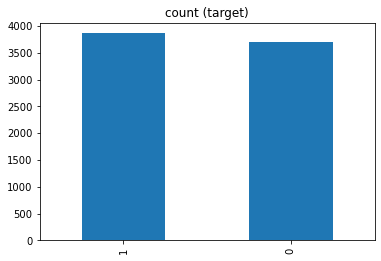

In [11]:
#In order to "translate" the above visual correctly, we will represent the same information with numbers
#First check for balance
dependent_analysis = dataset_final['Delay'].value_counts(normalize=True) * 100
print(dependent_analysis)

class_count_01, class_count_02 = dataset_final['Delay'].value_counts()
dataset_final['Delay'].value_counts().plot(kind='bar', title='count (target)')

print('class 0:', class_count_02)
print('class 1:', class_count_01)

In [12]:
#Find the mean value of every column for every class
target = [0,1]
class_feature_means = pd.DataFrame(columns=target)
for c, rows in dataset_final.groupby('Delay'):
    class_feature_means[c] = rows.mean()
class_feature_means

,0,1
Lat Arr,37.926836,36.164094
Lon Arr,0.365289,4.849247
Hours_Arr,13.399514,12.746957
Minutes_Arr,28.406537,28.462574
Hours_Dep,13.360886,12.913235
Minutes_Dep,26.282820,27.277389
Day,13.938682,14.577053
Month,2.030524,3.217301
Year,20.927337,20.816887
Delay,0.000000,1.000000


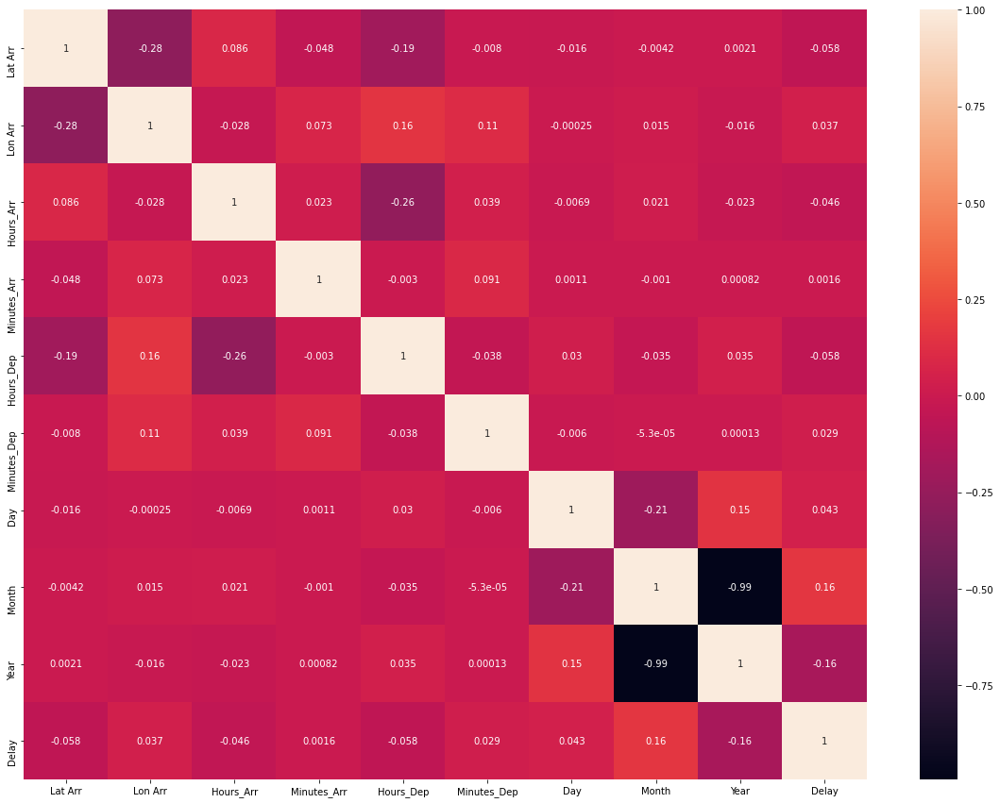

In [13]:
#Visualize correlations part1
plt.figure(figsize=(20,15))
sns.heatmap(dataset_final.corr(), annot=True)
plt.show()


In [14]:
#Visualize correlation part2 (plots)
fig = px.scatter_matrix(dataset_final)
fig.show()
#plot(fig)

In [15]:
#Due to lack of data (airlines do not share for free their data), we see that we have low correlated variables (with the dependent variable)
#Next step, is to check the distribution of the models regarding delay and their contribution on the total number of flights
fig = px.density_heatmap(dataset_final, x=dataset_final["Delay"], y=dataset_final["AC Model"], marginal_x="rug", marginal_y="histogram")
fig.show()
#plot(fig)

In [16]:
fig = px.density_heatmap(dataset_final, x=dataset_final["Delay"], y=dataset_final["Airline"], marginal_x="rug", marginal_y="histogram")
fig.show()
#plot(fig)

In [17]:
fig = px.density_heatmap(dataset_final, x=dataset_final["Delay"], y=dataset_final["FlightNo"], marginal_x="rug", marginal_y="histogram")
fig.show()
#plot(fig)

In [18]:
#In this step, we will tranform all categorical features to numerical with the one-hot-encoding technique (with pandas library)

#Create new datasets with the one-hot-encoded categorical values
dataset1 = pd.get_dummies(dataset_final["FlightNo"] , drop_first=True)
dataset2 = pd.get_dummies(dataset_final["AC Model"], drop_first=True)
dataset3 = pd.get_dummies(dataset_final["Dest Country"], drop_first=True)
dataset4 = pd.get_dummies(dataset_final["Airline"], drop_first=True) #Drop first is a technique to help the machine on the value iteration and be more accurate

#Concatenate the new datasets to the main dataset
merged = pd.concat([dataset_final, dataset1, dataset2, dataset3, dataset4], axis='columns')

#Drop the columns with categorical values
final = merged.drop(['FlightNo' , 'AC Model' , 'Dest Country', 'Airline'], axis='columns')

#Now we have only numerical values
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7563 entries, 0 to 7562
Columns: 662 entries, Lat Arr to WY
dtypes: float64(2), int32(7), int64(1), uint8(652)
memory usage: 5.1 MB


In [19]:
#Split the independent and dependent variables to X, y
y = final["Delay"].values
X = final.drop(["Delay"], axis = 'columns') #remove dependent variable

In [20]:
'''we can call for new data to predict the flights that have not yet happened, if there will
be any delay'''
#*Extra step explained, not for usage now, will use data in the end
#First import libraries
import time
import requests
import pandas as pd
import pyodbc
from six.moves import urllib
from sqlalchemy import create_engine
import datetime
from datetime import datetime as dt
from datetime import date, timedelta
import numpy as np
import os
from fp.fp import FreeProxy
#Change proxy for every "hit", in order to avoid IP ban
def make_me_invisible():
    global proxy
    proxy1 = FreeProxy(timeout=1, rand=True, anonym=False).get()
    proxy2 = 'http://' 
    proxy = {proxy2 : proxy1}
    while len(proxy1) > 27:
        proxy1 = FreeProxy(timeout=1, rand=True, anonym=False).get()
        proxy2 = 'http://' 
        proxy = {proxy2 : proxy1}  
    return proxy
#Scrapping Data (details on Github ReadMe file too)
pd.set_option('mode.chained_assignment', None) #settings configuration to avoid Raise Warning due to appending method of csv file
make_me_invisible() #call for proxy change
df_merged = pd.DataFrame() #set empty dataframe
for i in range(10,-10,-1): #JSON Pages that load to the website
    #setting the GET method parameters to request data from the FlightRaar24 API
    URL =  'https://api.flightradar24.com/common/v1/airport.json?code=LHR&plugin[]=&plugin-setting[schedule][mode]=departures&plugin-setting[schedule][timestamp]={}&page='+str(i)+'&limit=100&fleet=&token='
    response = requests.get(URL.format(int(time.time())), headers={'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_4) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1 Safari/605.1.15'})
    data = response.json()
    
    #choose which child of the json we need to put to a dataframe
    df1 = pd.json_normalize(data['result']['response']['airport']['pluginData']['schedule']['departures']['data'])        
    df_merged = pd.concat([df1,df_merged])
    
#data cleansing and re-formatting    
df = df_merged[['flight.identification.number.default','flight.status.text','flight.status.generic.status.text',
                'flight.aircraft.model.code','flight.airport.destination.position.latitude',
                'flight.airport.destination.position.longitude','flight.airport.destination.position.country.code',
                'flight.time.scheduled.departure','flight.time.real.arrival','flight.time.real.departure',
                'flight.time.scheduled.arrival']]
df.rename(columns={'flight.identification.number.default': 'FlightNo','flight.status.generic.status.text':'Status',
                   'flight.time.scheduled.arrival': 'ScheduledTimeArr' , 'flight.status.text' : 'ActualTimeDep',
                   'flight.aircraft.model.code':'AC Model', 'flight.airport.destination.position.latitude' : 'Lat Arr',
                   'flight.airport.destination.position.longitude':'Lon Arr','flight.airport.destination.position.country.code':'Dest Country',
                   'flight.time.real.arrival':'Actual Arr', 'flight.time.real.departure':'Actual Dep',
                   'flight.time.scheduled.departure':'ScheduledTimeDep'
                   }, inplace=True)
df['ScheduledTimeDep'] = pd.to_datetime(df['ScheduledTimeDep'],unit='s')
df['Actual Arr'] = pd.to_datetime(df['Actual Arr'],unit='s')
df['Actual Dep'] = pd.to_datetime(df['Actual Dep'],unit='s')
df['ScheduledTimeArr'] = pd.to_datetime(df['ScheduledTimeArr'],unit='s')
var1 = pd.to_datetime(df['ScheduledTimeArr'] , format='%Y-%m-%d %H:%M:%S').dt.time
var2 = pd.to_datetime(df['Actual Arr'] , format='%Y-%m-%d %H:%M:%S').dt.time.rename('ActualTimeArr')
var3 = pd.to_datetime(df['Actual Dep'] , format='%Y-%m-%d %H:%M:%S').dt.time.rename('ActualTimeDep.1')
var4 = pd.to_datetime(df['ScheduledTimeDep'] , format='%Y-%m-%d %H:%M:%S').dt.date.rename('Date')
var5 = pd.to_datetime(df['ScheduledTimeDep'] , format='%Y-%m-%d %H:%M:%S').dt.time
df_final = df.drop(['ScheduledTimeDep','Actual Dep','Actual Arr','ScheduledTimeArr'],axis='columns')
dataset = pd.concat((df_final , var1,var2,var3,var4,var5),axis='columns')
#Now we have to preprocess the data and keep the schedule flights, the flights we want to predict if will have delay>15 minutes
#Data Cleansing
pd.DataFrame.drop_duplicates(dataset,inplace=True) #drop duplicate values
dataset1 = dataset[dataset["Status"] == "departed"] #That means that we will keep all values which have status "departed"
dataset1 = dataset1.drop(["Status"], axis= "columns") #Drop this column now, it is not needed
dataset1["difference"]=pd.to_timedelta(dataset1["ActualTimeDep.1"].astype(str))-pd.to_timedelta(dataset1["ScheduledTimeDep"].astype(str)) #Find time difference between actual and scheduled
dataset1['duration'] = dataset1['difference'].astype(str).str[7:] #Keep only time as string
dataset1[['Hours' , 'Minutes' , 'Seconds']] = dataset1['duration'].str.split(':',expand=True)#Split hours, minutes, seconds
dataset1['Hours'] = dataset1['Hours'].astype(str).str.replace("+", "-")
dataset1['Hours'] = dataset1['Hours'].astype(int)
dataset1['Minutes'] = dataset1['Minutes'].astype(int)
dataset1['Seconds'] = dataset1['Seconds'].astype(int)
dataset1 = dataset1.reset_index()
dataset1 = dataset1.drop(dataset1.columns[0], axis=1)
dataset1["Delay"]=0
for i in dataset1.index:
    if dataset1['Hours'][i] >0 :
        dataset1["Delay"][i]=1
for i in dataset1.index:
    if dataset1['Minutes'][i] > 20 and dataset1['Hours'][i] >=0:
        dataset1["Delay"][i] = 1
dataset_final = dataset1.drop(["ActualTimeDep", "ActualTimeArr", "ActualTimeDep.1", "difference", "duration", "Hours", "Minutes", "Seconds" ], axis=1)
dataset_final[['Hours_Arr' , 'Minutes_Arr' , 'Seconds_Arr']] = dataset_final['ScheduledTimeArr'].astype(str).str.split(':',expand=True)#Split hours, minutes, seconds
dataset_final[['Hours_Dep' , 'Minutes_Dep' , 'Seconds_Dep']] = dataset_final['ScheduledTimeDep'].astype(str).str.split(':',expand=True)#Split hours, minutes, seconds
dataset_final = dataset_final.drop(["ScheduledTimeArr", "ScheduledTimeDep", 'Seconds_Arr', 'Seconds_Dep'], axis=1)
dataset_final[['Year' , 'Month' , 'Day']] = dataset_final['Date'].astype(str).str.split('-',expand=True)
final_new = dataset_final.drop(["Date"], axis=1)
#Feature engineering: From FlightNo we can extract the first 2 letters that represent the airline and add it to a new column
final_new['Airline'] =  final_new['FlightNo'].str[:2]
dataset1 = pd.get_dummies(final_new["FlightNo"] , drop_first=True)
dataset2 = pd.get_dummies(final_new["AC Model"], drop_first=True)
dataset3 = pd.get_dummies(final_new["Dest Country"], drop_first=True)
dataset4 = pd.get_dummies(final_new["Airline"], drop_first=True)
merged = pd.concat([final_new, dataset1, dataset2, dataset3, dataset4], axis='columns')
#Drop the columns with categorical values
final_new = merged.drop(['FlightNo' , 'AC Model' , 'Dest Country', 'Airline'], axis='columns')
'''
pd.DataFrame.drop_duplicates(dataset,inplace=True) #drop duplicate values
dataset = dataset[dataset["Status"] == "departed"] #That means that we will keep all values which have status "departed"
dataset = dataset.drop(["Status", "ActualTimeDep", "ActualTimeArr", "ActualTimeDep"], axis= "columns") #Drop these columns now, they are not needed
dataset[['Hours_Arr' , 'Minutes_Arr' , 'Seconds_Arr']] = dataset['ScheduledTimeArr'].astype(str).str.split(':',expand=True)#Split hours, minutes, seconds
dataset[['Hours_Dep' , 'Minutes_Dep' , 'Seconds_Dep']] = dataset['ScheduledTimeDep'].astype(str).str.split(':',expand=True)#Split hours, minutes, seconds
dataset = dataset.drop(["ScheduledTimeArr", "ScheduledTimeDep", 'Seconds_Arr', 'Seconds_Dep'], axis=1)
dataset[['Year' , 'Month' , 'Day']] = dataset['Date'].astype(str).str.split('-',expand=True)
dataset = dataset.drop(["Date"], axis=1)
#In this step we fix a data retrieval error that took place when the year changed, and the format of the date changed too
dataset['Year'] = dataset['Year'].astype(str)
dataset['Year'] = dataset['Year'].str.extract('.*(\d{2})', expand = False)
dataset['Year'] = dataset['Year'].astype(int)
#Some re-arrangement
dataset = dataset[['FlightNo','AC Model','Lat Arr','Lon Arr','Dest Country','Hours_Arr','Minutes_Arr','Hours_Dep','Minutes_Dep','Day','Month','Year']]
#Feature engineering: From FlightNo we can extract the first 2 letters that represent the airline and add it to a new column
dataset['Airline'] =  dataset['FlightNo'].str[:2]
dataset['Hours_Arr'] = dataset['Hours_Arr'].astype(int)
dataset['Minutes_Arr'] = dataset['Minutes_Arr'].astype(int)
dataset['Hours_Dep'] = dataset['Hours_Dep'].astype(int)
dataset['Minutes_Dep'] = dataset['Minutes_Dep'].astype(int)
dataset = dataset.dropna()
dataset.info()
#We follow the same pattern as on train
dataset1 = pd.get_dummies(dataset["FlightNo"] , drop_first=True)
dataset2 = pd.get_dummies(dataset["AC Model"], drop_first=True)
dataset3 = pd.get_dummies(dataset["Dest Country"], drop_first=True)
dataset4 = pd.get_dummies(dataset["Airline"], drop_first=True)
merged = pd.concat([dataset, dataset1, dataset2, dataset3, dataset4], axis='columns')
#Drop the columns with categorical values
final_new = merged.drop(['FlightNo' , 'AC Model' , 'Dest Country', 'Airline'], axis='columns')
#Now we have only numerical values
final_new.info()
'''

#In order to cover the possibilities of train with more or less data than prediction, we find the differences of the sets
#of actual and schedule data and cover the gap between them by adding new columns with zeros. So now we have same number of features and identical features

y_final_validation = final_new["Delay"].values
X_final_validation = final_new.drop(["Delay"], axis = 'columns') 

feature_difference1 = set(X) - set(X_final_validation) 
feature_difference2 = set(X_final_validation) - set(X)  
feature_difference_df1 = pd.DataFrame(data=np.zeros((final_new.shape[0], len(feature_difference1))),
                                     columns=list(feature_difference1))
feature_difference_df2 = pd.DataFrame(data=np.zeros((X.shape[0], len(feature_difference2))),
                                     columns=list(feature_difference2))
final_new2 = X_final_validation.join(feature_difference_df1)
X2 = X.join(feature_difference_df2)

final_new2 = final_new2.loc[:,~final_new2.columns.duplicated()]
X2 = X2.loc[:,~X2.columns.duplicated()]
X_final_validation = final_new2.fillna(0)
X = X2.fillna(0)

In [21]:
#Continuing the steps
X = X.iloc[:, :].values
X = np.array( X , dtype = np.str)

In [22]:
#Now perform the split of train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3) #We will keep a random 70% of the dataset to train and a random 30% to test


In [23]:
#Only for visualization purposes, we will perform PCA
pca = PCA(n_components=3)
components = pca.fit_transform(X_train)
total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter_3d(
    components, x=0, y=1, z=2,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'})
fig.show()
#plot(fig)

In [24]:
pca = PCA()
pca.fit(X_train)
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

plot1 = px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "# Components", "y": "Explained Variance"}
)

plot1.show()
#plot(plot1)

In [25]:
#As we saw, almost all of the variance is explained with 3 features
final.describe()

,Lat Arr,Lon Arr,Delay
count,229.000000,229.000000,229.000000
mean,36.605634,-1.263769,0.602620
std,15.168900,64.321283,0.490428
min,-26.139099,-123.183998,0.000000
25%,26.270830,-73.778900,0.000000
50%,40.488701,3.321156,1.000000
75%,47.598900,38.799309,1.000000
max,60.317219,139.779602,1.000000


In [26]:
#Now we have to scale the data

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
print(X_train)
print(X_test)

[[-1.56657029 -1.02947139  0.85842671 ... -0.06459868  0.
   0.        ]
 [ 0.77789732 -0.01140051  0.57516489 ... -0.06459868  0.
   0.        ]
 [ 0.99646349  0.1682311   0.43353398 ... -0.06459868  0.
   0.        ]
 ...
 [-0.27343597 -1.64550879  1.14168853 ... -0.06459868  0.
   0.        ]
 [ 0.36577642  0.33070788  1.00005762 ... -0.06459868  0.
   0.        ]
 [ 0.23168656 -1.26388077  0.85842671 ... -0.06459868  0.
   0.        ]]
[[-1.83382581  0.5832749  -1.26603694 ... -0.06459868  0.
   0.        ]
 [-0.21315017  0.52894998  0.43353398 ... -0.06459868  0.
   0.        ]
 [-0.23088448  1.14157081 -1.69092966 ... -0.06459868  0.
   0.        ]
 ...
 [-0.21315017  0.52894998  0.43353398 ... -0.06459868  0.
   0.        ]
 [ 1.14358332 -0.1496892  -0.27462057 ... -0.06459868  0.
   0.        ]
 [-0.7721079   0.85507152  0.85842671 ... -0.06459868  0.
   0.        ]]


In [27]:
#Now we are ready to perfom machine learning
#First Classifier: SVM kernel

classifier = SVC(kernel = 'rbf', probability=True)
classifier.fit(X_train, y_train)
y_pred1 = classifier.predict(X_test)
cm1 = confusion_matrix(y_test, y_pred1)
print(cm1)
print(accuracy_score(y_test, y_pred1))
report = classification_report(y_test, y_pred1)
print(report)
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

[[706 411]
 [350 802]]
0.6646099603349493
              precision    recall  f1-score   support

           0       0.67      0.63      0.65      1117
           1       0.66      0.70      0.68      1152

    accuracy                           0.66      2269
   macro avg       0.66      0.66      0.66      2269
weighted avg       0.66      0.66      0.66      2269

Training set score: 0.722
Test set score: 0.665


In [28]:
#Analyze the results of SVM with probabilities

classifier = SVC(kernel = 'rbf', probability=True)
classifier.fit(X_train, y_train)
y_pred11 = classifier.predict_proba(X_test)
delay_probs = y_pred11[:, 1]
nodelay_probs = y_pred11[:, 0]
nodelay_auc = roc_auc_score(y_test, nodelay_probs)
delay_auc = roc_auc_score(y_test, delay_probs)
#Summarize scores
print('No Delay: ROC AUC=%.3f' % (nodelay_auc))
print('Delay: ROC AUC=%.3f' % (delay_auc))

KeyboardInterrupt: 

In [ ]:
#Plotting ROC
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, nodelay_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, delay_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Delay')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Delay')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

In [ ]:
#Second Classifier: Decision Tree
classifier = DecisionTreeClassifier(criterion = 'entropy')
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

In [ ]:
#Analyze the results of Decision Tree
tree.plot_tree(classifier)
plt.show()

In [ ]:
#Analyze the results of Decision Tree
report = classification_report(y_test, y_pred)
print(report)

In [35]:
#Third Classifier: Random Forest
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))
y_pred = y_pred>0
classifier.feature_importances_
report = classification_report(y_test, y_pred)
print(report)

[[921 196]
 [229 923]]
0.8126928162185985
Training set score: 0.982
Test set score: 0.813
              precision    recall  f1-score   support

           0       0.80      0.82      0.81      1117
           1       0.82      0.80      0.81      1152

    accuracy                           0.81      2269
   macro avg       0.81      0.81      0.81      2269
weighted avg       0.81      0.81      0.81      2269



In [ ]:
#Fourth Classifier: KNN
classifier = KNeighborsClassifier(n_neighbors = 2, metric = 'minkowski', p = 2) #euclidean distance, also after many tries 2NN is the optimal
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
report = classification_report(y_test, y_pred)
print(report)
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

In [32]:
#Fifth Classifier: XGB
classifier = XGBClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
report = classification_report(y_test, y_pred)
print(report)
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

[[737 380]
 [340 812]]
0.6826795945350375
              precision    recall  f1-score   support

           0       0.68      0.66      0.67      1117
           1       0.68      0.70      0.69      1152

    accuracy                           0.68      2269
   macro avg       0.68      0.68      0.68      2269
weighted avg       0.68      0.68      0.68      2269

Training set score: 0.720
Test set score: 0.683


In [ ]:
#Analyze the results of XGB with probabilities
classifier = XGBClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict_proba(X_test)
delay_probs = y_pred[:, 1]
nodelay_probs = y_pred[:, 0]
nodelay_auc = roc_auc_score(y_test, nodelay_probs)
delay_auc = roc_auc_score(y_test, delay_probs)
#Summarize scores
print('No Delay: ROC AUC=%.3f' % (nodelay_auc))
print('Delay: ROC AUC=%.3f' % (delay_auc))

In [ ]:
#Plotting ROC
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(y_test, nodelay_probs)
lr_fpr, lr_tpr, _ = roc_curve(y_test, delay_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Delay')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Delay')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

In [37]:
#Sixth Classifier: Logistic Regression
classifier = LogisticRegression(solver='lbfgs', max_iter=10000)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
#y_pred = (y_pred > 0.5 )
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))
print(classifier.coef_, classifier.intercept_)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

Training set score: 0.739
Test set score: 0.684
[[-9.48663082e-02  4.33264870e-02  4.93284100e-01 -1.49343126e-01
  -3.16762108e-01 -1.37818603e-01  2.14811666e-01  7.79012283e-01
   2.66528233e-01  2.96540235e-02 -5.13493690e-03 -2.84193079e-02
  -1.45112242e-01 -2.93500070e-02 -1.16583987e-01 -2.58406745e-02
  -2.27761991e-01 -1.00724441e-01  7.01414524e-02 -5.88840904e-02
  -4.78320133e-02 -3.44743025e-02 -1.55227914e-01 -1.28572199e-01
   1.07426465e-03 -9.28793276e-02  4.91140452e-02 -4.60479945e-02
  -1.08861658e-01  2.79584446e-02 -1.25442913e-02 -1.05921087e-02
  -2.33848425e-01  5.34544986e-02  1.35704791e-01  7.60613688e-02
   5.59570529e-02 -5.78770300e-02  7.51574091e-02  8.13920470e-02
   7.43837015e-02 -4.16470332e-02  7.85003653e-02  4.40281249e-02
   0.00000000e+00  5.53614653e-02  5.08121847e-03 -1.77198895e-01
   1.62690354e-02 -7.58232533e-02  1.65809922e-02  1.10135256e-01
   1.23709633e-02  0.00000000e+00  6.89741708e-02 -9.98373579e-02
   1.54912675e-02  1.0188749

In [ ]:
report = classification_report(y_test, y_pred)
print(report)

In [ ]:
#Seventh Classifier: a simple ANN Classifier with 2 hidden layers and 5 nodes each layer
ann = tf.keras.models.Sequential()
ann.add(tf.keras.layers.Dense(units= 5 , activation='relu'))
#ann.add(tf.keras.layers.Dropout(0.2))
ann.add(tf.keras.layers.Dense(units= 5 , activation='relu'))
#ann.add(tf.keras.layers.Dropout(0.2))
ann.add(tf.keras.layers.Dense(units=1, activation='sigmoid')) #almost like logistic regression

ann.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.01) , loss = 'binary_crossentropy', metrics = ['accuracy'])
ann.fit(X_train, y_train, batch_size = 250 , epochs = 250 , validation_data=(X_test, y_test))

print(ann.summary())
print(ann.get_weights())

#first train#

In [ ]:
# Predicting the Test set results
y_pred = ann.predict_proba(X_test)
y_pred = (y_pred > 0.5 )

cm = confusion_matrix(y_test, y_pred)
accuracy_score(y_test, y_pred)
results = accuracy_score(y_test, y_pred)

print(cm)
print(results)

1    60.262009
0    39.737991
Name: Delay, dtype: float64
class 0: 91
class 1: 138


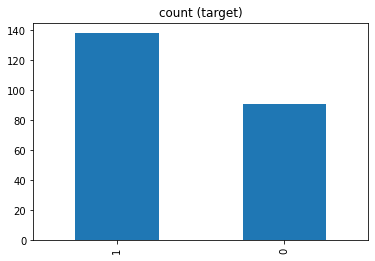

In [39]:
dependent_analysis = final_new['Delay'].value_counts(normalize=True) * 100
print(dependent_analysis)

class_count_01, class_count_02 = final_new['Delay'].value_counts()
final_new['Delay'].value_counts().plot(kind='bar', title='count (target)')

print('class 0:', class_count_02)
print('class 1:', class_count_01)

In [40]:
#Now that we have analyzed our models, and chosen , we can perform a validation of flights that happended in the past 24 hoours
X_final_validation = sc.transform(X_final_validation)



y_pred = classifier.predict(X_final_validation)
cm = confusion_matrix(y_final_validation, y_pred)
print(cm)
print(accuracy_score(y_final_validation, y_pred))
report = classification_report(y_final_validation, y_pred)
print(report)
print("Test set score: {:.3f}".format(classifier.score(X_final_validation,y_final_validation)))

[[55 36]
 [84 54]]
0.4759825327510917
              precision    recall  f1-score   support

           0       0.40      0.60      0.48        91
           1       0.60      0.39      0.47       138

    accuracy                           0.48       229
   macro avg       0.50      0.50      0.48       229
weighted avg       0.52      0.48      0.48       229

Test set score: 0.476
